# Visualize dataset raw image stack

<img src="http://reconstrue.com/assets/images/reconstrue_logo_brandmark.svg" width="50px"/>

This notebook will download a single cell's z-stack from The Allen Institute's BioImage 2019 Brightfield Challenge dataset and vizualize the raw input images. This notebook does not create reconstructions, rather it renders image stacks and SWCs found in the dataset.

Various visualizations are generated, for viewing over the web:
- downsampled imagestack
- single image viewer
- animated GIF stack view
- Movie (timeline is stack index)

The plot of the notebook is:
- User specifies a neuron ID
- Code downloads image stack
- Code dumps metadata on a sample .tif file
- Code generates a minimal intensity projection (i.e. 3D => 2D)
- Code generates web friendly animations of image stack 


## Specify which cell ID to visualize

These Brightfield Challenge image stacks are large, approximately 6GB to 60GB. 

Colab provides 50GB or 360GB if the runtime is configured to use a GPU. So, you might want to set up a GPU for the runtime if you are planning on working on a large neuron image stack. In the Runtime menu, select "Change runtime type" and for "Hardware accelleration" select GPU (pretty simple; for a before and after comparision of file system size, use `!df -h` ).

The following download script simply needs to be told which directory to download. The data will be downloaded into directory, `/content/brightfield_challenge_dataset/`.

## Define notebook constants
The idea is that this code can be used on any cell in the Brightfield Challenge dataset. Only thing that should change are the following two constants. After that select Runtime menu, Run all.

In [0]:
# Set 2 constants, then "Run all":

#Pick a cell to download and exercise
cell_id = "651806289"

# Where in the dataset is that cell's data?
# - For training neurons, will look like "651806289/"
# - For Testing neurons, will look like "TEST_DATA_SET/715953708/"
dataset_file_system_prefix_for_cell_data = "651806289/"

In [9]:
import os

# Build some filenames based off the cell ID
local_cache_dir = "/content/allen_institute_dataset/"
image_stack_src_dir = os.path.join(local_cache_dir, cell_id, "src")
print("Image stack will be downloaded to:\n" + image_stack_src_dir)

Image stack will be downloaded to:
/content/allen_institute_dataset/651806289/src


## Download data

On a good day downloading 651806289's 6.1 GB takes about 1 minute.

**TODO:**
This should only download if the files are not already in the local file cache.

In [34]:
import os
import boto3
import time
from IPython.display import HTML, display

# The single parameter which needs to be set. Which directory's files to download
a_prefix = dataset_file_system_prefix_for_cell_data

start = time.time()

def progress(value, max=100):
    return HTML("""
        <progress
            value='{value}'
            max='{max}',
            style='width: 100%'
        >
            {value}
        </progress>
    """.format(value=value, max=max))
  
s3 = boto3.resource('s3',
     endpoint_url = 'https://s3.us-west-1.wasabisys.com',
     aws_access_key_id = '2G7POM6IZKJ3KLHSC4JB',
     aws_secret_access_key = "0oHD5BXPim7fR1n7zDXpz4YoB7CHAHAvFgzpuJnt")  
bucket = s3.Bucket('brightfield-auto-reconstruction-competition')

# Default pwd on Colab is /content, so chdir into DL target dir first
destination_directory = image_stack_src_dir
if not os.path.exists(destination_directory):
  os.makedirs(destination_directory)
os.chdir(destination_directory)

# Set up a progress indicator for this slow task:
import datetime
currentDT = datetime.datetime.now()
print("Start downloading at: " + str(currentDT))

# TODO: Hardwired. Should count how many before actually downloading
#       via bucket.objects.filter(Prefix = a_prefix)
progressIndicator = display(progress(0, 291), display_id=True)
progressIndicator_count = 0
progressIndicator_end = 291

print("Downloading files from dataset directory:\n  " + a_prefix)
print("Downloading to:\n  " + destination_directory)
imagestack_bytes = 0
imagestack = []
swc_key = None


#for my_bucket_object in bucket.objects.all():
#    print(my_bucket_object)

for s3_object in bucket.objects.filter(Prefix = a_prefix):
  print(s3_object.key + " = " + str(s3_object.size) + " bytes")
  if s3_object.key != a_prefix:
    # if == it's the directory itself, not a file in it so ignore
    progressIndicator_count += 1
    progressIndicator.update(progress(progressIndicator_count, progressIndicator_end))

    # Need to split s3_object.key into path and file name, else it will give error file not found.
    path, filename = os.path.split(s3_object.key)
    bucket.download_file(s3_object.key, filename)
    
end = time.time()
print("Download time: " + "%s seconds" %(int(end - start)))


Start downloading at: 2019-10-18 02:30:19.486959


  651806289/
  /content/allen_institute_dataset/651806289/src
651806289/ = 0 bytes
651806289/651806289.swc = 357805 bytes
651806289/reconstruction_0_0539044762_644941196-0001.tif = 22320997 bytes
651806289/reconstruction_0_0539044762_644941196-0002.tif = 22320997 bytes
651806289/reconstruction_0_0539044762_644941196-0003.tif = 22320997 bytes
651806289/reconstruction_0_0539044762_644941196-0004.tif = 22320997 bytes
651806289/reconstruction_0_0539044762_644941196-0005.tif = 22320997 bytes
651806289/reconstruction_0_0539044762_644941196-0006.tif = 22320997 bytes
651806289/reconstruction_0_0539044762_644941196-0007.tif = 22320997 bytes
651806289/reconstruction_0_0539044762_644941196-0008.tif = 22320997 bytes
651806289/reconstruction_0_0539044762_644941196-0009.tif = 22320997 bytes
651806289/reconstruction_0_0539044762_644941196-0010.tif = 22320997 bytes
651806289/reconstruction_0_0539044762_644941196-0011.tif = 22320997 bytes
651806289/reconstruction_0_0539044762_644941196-0012.tif = 22320

## Check download size


In [57]:
# Peek at the download cache on file system

!du -h {local_cache_dir}
!echo
!echo Image stack size:
!ls -1 {image_stack_src_dir}/*.tif|wc -l


6.1G	/content/allen_institute_dataset/651806289/src
6.1G	/content/allen_institute_dataset/651806289
6.1G	/content/allen_institute_dataset/

Image stack size:
291


## Inspect one of the TIFF files

So, what exactly is the format of the TIFF files in the image stacks? Let's inspect a file's internals.

Randomly pick one, call it `a_rando_image_stack_file`, and check it out.*italicized text*

In [59]:
# How big is a random image? (Kinda assuming all are same size.)

import os
import glob

filter = image_stack_src_dir + "/*.tif"
tif_files = glob.glob(filter)
# print(str(len(tif_files)) + " files = " + filter)

# https://stackoverflow.com/a/1094933
def sizeof_fmt(num, suffix='B'):
  for unit in ['','Ki','Mi','Gi','Ti','Pi','Ei','Zi']:
    if abs(num) < 1024.0:
      return "%3.1f%s%s" % (num, unit, suffix)
    num /= 1024.0
  return "%.1f%s%s" % (num, 'Yi', suffix)

if not tif_files:
  print("no .tif files found")
else:
  a_rando_image_stack_file = tif_files[0] # pick one; rando b/c glob doesn't sort                  
  byte_size = sizeof_fmt(os.path.getsize(a_rando_image_stack_file))
  print(byte_size + " = " + a_rando_image_stack_file )

21.3MiB = /content/allen_institute_dataset/651806289/src/reconstruction_0_0539044762_644941196-0217.tif


### Look at it

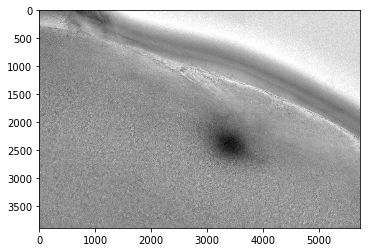

In [64]:
import matplotlib.pyplot as plt

input_image = Image.open(a_rando_image_stack_file)

plt.imshow(input_image, cmap = plt.cm.gray) 

### Dump out `info` values

Note, for the `mode` the value of [`L` means "8-bit pixels, black and white"]( (https://pillow.readthedocs.io/en/5.1.x/handbook/concepts.html).

In [62]:
from PIL import Image

try:
  with Image.open(a_rando_image_stack_file) as im:
    print("file: " + a_rando_image_stack_file)
    print("format: " + im.format)
    print("WxH: " + "%dx%d" % im.size)
    print("mode: " + im.mode) # mode is RGB or L
    #print(im.info)
    for k, v in im.info.items():
      print(k + ": " + str(v) ) #+ im.info[factoid][1]) #+ factoid[1])# + factoid.value)
except IOError:
  pass

file: /content/allen_institute_dataset/651806289/src/reconstruction_0_0539044762_644941196-0217.tif
format: TIFF
WxH: 5730x3890
mode: L
compression: raw
dpi: (1, 1)
resolution: (1, 1)


### Dump out tags

In [63]:
from PIL import Image
from PIL.TiffTags import TAGS

# resize tif from 22.3MB to 223.KB
# https://stackoverflow.com/a/54526478
with Image.open(a_rando_image_stack_file) as img:
    meta_dict = {}
    for key in img.tag:      # don't really need iterkeys in this context
        meta_dict[TAGS.get(key,'missing')] = img.tag[key]

# print( meta_dict)
for k, v in meta_dict.items():
  print(k + ": " + str(v))

ImageWidth: (5730,)
ImageLength: (3890,)
BitsPerSample: (8,)
Compression: (1,)
PhotometricInterpretation: (1,)
ImageDescription: ('GRAY version',)
StripOffsets: (8, 5738, 11468, 17198, 22928, 28658, 34388, 40118, 45848, 51578, 57308, 63038, 68768, 74498, 80228, 85958, 91688, 97418, 103148, 108878, 114608, 120338, 126068, 131798, 137528, 143258, 148988, 154718, 160448, 166178, 171908, 177638, 183368, 189098, 194828, 200558, 206288, 212018, 217748, 223478, 229208, 234938, 240668, 246398, 252128, 257858, 263588, 269318, 275048, 280778, 286508, 292238, 297968, 303698, 309428, 315158, 320888, 326618, 332348, 338078, 343808, 349538, 355268, 360998, 366728, 372458, 378188, 383918, 389648, 395378, 401108, 406838, 412568, 418298, 424028, 429758, 435488, 441218, 446948, 452678, 458408, 464138, 469868, 475598, 481328, 487058, 492788, 498518, 504248, 509978, 515708, 521438, 527168, 532898, 538628, 544358, 550088, 555818, 561548, 567278, 573008, 578738, 584468, 590198, 595928, 601658, 607388, 61311

## Generate a MinIP cover image

The [minimum_intensity_projection](https://en.wikipedia.org/wiki/Minimum_intensity_projection) of a stack of z-images is kinda like the view if holding the real glass slide in your hand and looking through it.

Implementation details: Some of these cell image stacks are ~60GB. Wise to only load one at a time – "out of memory" style to not stress RAM. (Would be prime candidate for Numba onto Colab's T4 GPU.)

Load one image at a time and compares it to the running-minimums image, which when done will be the MinIP image to be saves.


In [2]:
# https://stackoverflow.com/a/52085463
import numpy as np
import matplotlib.pyplot as plt
from skimage import io
from IPython.display import HTML, display

# List files of imager stack:
tif_filenames = glob.glob(image_stack_src_dir + "/*.tif")
tif_filenames.sort() 

# Little progress bar printer
def progress(value, max=100):
    return HTML("""
        <progress
            value='{value}'
            max='{max}',
            style='width: 100%'
        >
            {value}
        </progress>
    """.format(value=value, max=max))

# Init progress bar
progress_bar = display(progress(0, len(tif_filenames)), display_id=True)
progress_count = 0

# projection is the main character, where the running minimums are accumulated
z_image_1 = tif_filenames[0]
projection = io.imread(z_image_1)
                       
for tif_filename in tif_filenames[1:]:
  progress_count += 1
  progress_bar.update(progress(progress_count, len(tif_filenames)))

  contender_image = io.imread(tif_filename)
  # For all pixels with same x and y, select the minimum intensity value 
  projection = np.minimum(projection, contender_image)
  # TODO: contender.closeFile?

projection_filename = cell_id + ".min_intensity_projection.tif"
absolute_filename = os.path.join(local_cache_dir, cell_id, projection_filename)  
io.imsave(absolute_filename, projection)
  
# TODO: this might be serving directory?          
# "/usr/local/share/jupyter/nbextensions/min_projection.tif"
# TODO: save a decimated, too
plt.imshow(projection, cmap = plt.cm.gray)


NameError: ignored

In [117]:
!ls -lh {absolute_filename}

-rw-r--r-- 1 root root 22M Oct 18 09:09 /content/allen_institute_dataset/651806289/651806289.min_intensity_projection.tif


In [13]:
!ls -lh /content/allen_institute_dataset/651806289/651806289.min_intensity_projection.tif

-rw-r--r-- 1 root root 340K Oct 18 09:46 /content/allen_institute_dataset/651806289/651806289.min_intensity_projection.tif


In [118]:
# Save it to Google Drive
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [14]:
!ls "/content/gdrive/My Drive/BioImage 2019 Challenge"
!cp /content/allen_institute_dataset/651806289/651806289.min_intensity_projection.tif "/content/gdrive/My Drive/BioImage 2019 Challenge"
!ls "/content/gdrive/My Drive/BioImage 2019 Challenge"


651806289.min_intensity_projection.tif
651806289.min_intensity_projection.tif


In [0]:
# 22MB is too big for github issues
import PIL                  
full_size = PIL.Image.open("/content/allen_institute_dataset/651806289/651806289.min_intensity_projection.tif")
width, height = full_size.size
quarter_size = full_size.resize((int(width/2), int(height/2)))

projection_filename = cell_id + ".min_intensity_projection.tif"
absolute_filename = os.path.join(local_cache_dir, cell_id, projection_filename)  
quarter_size.save("/content/allen_institute_dataset/651806289/651806289.min_intensity_projection.tif")

                               

In [129]:
!ls -lh {absolute_filename}

-rw-r--r-- 1 root root 22M Oct 18 09:09 /content/allen_institute_dataset/651806289/651806289.min_intensity_projection.tif


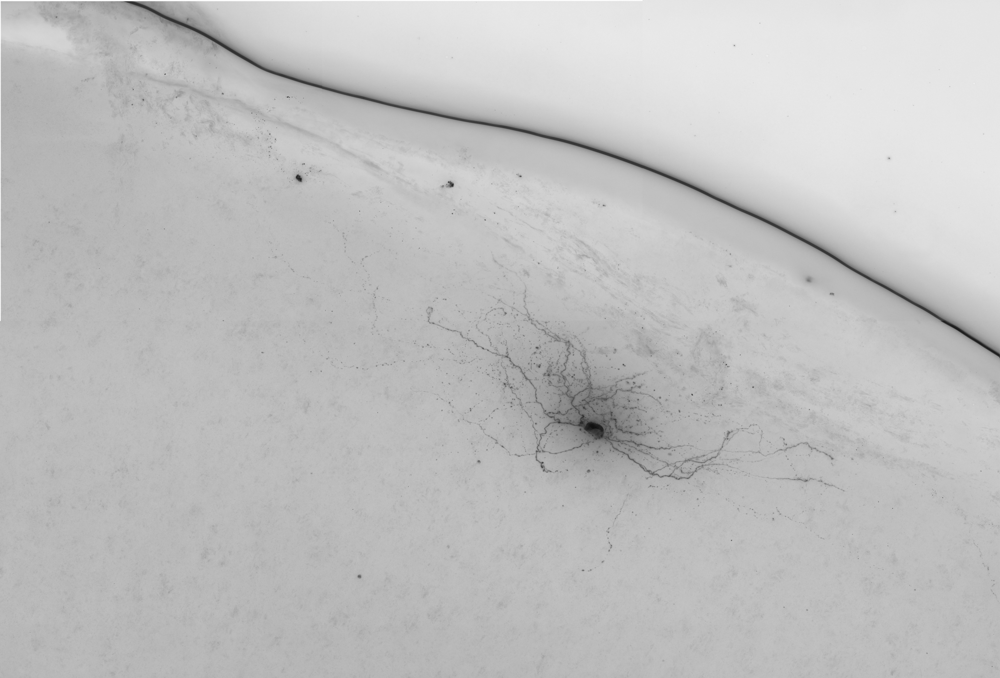

In [115]:
# This bring down the full high-res 22MB image
import PIL

display(PIL.Image.open(absolute_filename))

#works from memory: display(PIL.Image.fromarray(projection))

In [0]:
cp min_projection.tif usr/local/share/jupyter/nbextensions/

In [110]:
%%html
<img src="http://reconstrue.com/assets/images/reconstrue_logo_brandmark.svg" width="200px"/>


## Decimate whole image stack

The TIFF files in its image stack are each about (for example) 22MB, too big for over-the-web animation of the stack. 

So, reduce each file to 1/100th it's size (1/10 x 1/10 i.e. decimated), down to (respectively to example) 223KB per image. That can make for a < 100MB animation file.

In [69]:
# Downsample a whole image stack

import os
from os import listdir
from os.path import isfile, join

input_directory = image_stack_src_dir
#an_input_file_name = "reconstruction_0_0539044762_644941196-0001.downsampled.tif"
downsampled_directory = os.path.join(local_cache_dir, cell_id, "downsampled")

def decimate_image(image):
    "Processes the image to 1/10 size"
    width, height = image.size
    w = int(width/10)
    h = int(height/10)
    new_image = image.resize((w, h), Image.ANTIALIAS)
    return new_image

if not os.path.exists(downsampled_directory):
  os.makedirs(downsampled_directory)

# https://stackoverflow.com/a/3207973
only_files = [f for f in listdir(input_directory) if isfile(join(input_directory, f))]

for a_file in only_files:   
  if a_file.endswith(".tif"):
    input_name = join(input_directory, a_file)
    output_name = join(downsampled_directory, a_file)

    print("Downsampling: " + a_file)
    # print("  " + input_name)
    # print("  " + output_name)
    input_image = Image.open(input_name)
    decimated_image = decimate_image(input_image)
    decimated_image.save(output_name)
  else:
    print("Ignoring: " + a_file)


Downsampling: reconstruction_0_0539044762_644941196-0217.tif
  /content/allen_institute_dataset/651806289/downsampled/reconstruction_0_0539044762_644941196-0217.tif
Downsampling: reconstruction_0_0539044762_644941196-0166.tif
  /content/allen_institute_dataset/651806289/downsampled/reconstruction_0_0539044762_644941196-0166.tif
Downsampling: reconstruction_0_0539044762_644941196-0176.tif
  /content/allen_institute_dataset/651806289/downsampled/reconstruction_0_0539044762_644941196-0176.tif
Downsampling: reconstruction_0_0539044762_644941196-0168.tif
  /content/allen_institute_dataset/651806289/downsampled/reconstruction_0_0539044762_644941196-0168.tif
Downsampling: reconstruction_0_0539044762_644941196-0161.tif
  /content/allen_institute_dataset/651806289/downsampled/reconstruction_0_0539044762_644941196-0161.tif
Downsampling: reconstruction_0_0539044762_644941196-0273.tif
  /content/allen_institute_dataset/651806289/downsampled/reconstruction_0_0539044762_644941196-0273.tif
Downsampli

KeyboardInterrupt: ignored

In [0]:
# TODO: add progress indicator to above downsampler code
# Here's the progess code:

from IPython.display import HTML, display

def progress(value, max=100):
    return HTML("""
        <progress
            value='{value}'
            max='{max}',
            style='width: 100%'
        >
            {value}
        </progress>
    """.format(value=value, max=max))


# Set up a progress indicator for this slow task:
progressIndicator = display(progress(0, 100), display_id=True)
progressIndicator_count = 0
progressIndicator_end = 105

for x in something:
  progressIndicator_count += 1
  progressIndicator.update(progress(progressIndicator_count, progressIndicator_end))


### Explore downsampled image stack

This is a kinda lame little Z-stack image view. Lame b/c cannot programmatically set max value of slider.

Note, this UI looks cleaner if you [config this next cell to Form|Hide code](https://colab.research.google.com/notebooks/forms.ipynb#scrollTo=hVEG5D5TxFKW), after running it once.


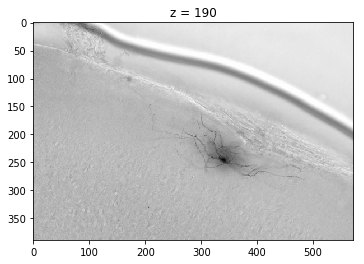

In [99]:
#@title Stack viewer { run: "auto", display-mode: "both" }

Z = 190 #@param {type:"slider", min:1, max:400, step:1}

import matplotlib.pyplot as plt
from PIL import Image

tifs = downsampled_directory + "/*.tif"
tif_files = glob.glob(tifs)
#print(str(len(tif_files)) + " files = " + filter)

# TODO: undo this hardcoded value
file_root = "/reconstruction_0_0539044762_644941196-"

z_4_wide = '{:04}'.format(Z)
downsampled_image_name = downsampled_directory + file_root + z_4_wide + ".tif"
                      
if os.path.exists(downsampled_image_name):  
  downed_image = Image.open(constructed_name)
  plt.title("z = " + str(Z))
  plt.imshow(downed_image, cmap = plt.cm.gray)
else:
  print("This downsampled image stack's max index is: " + str(len(tif_files)) )

=====================================================================

=====================================================================

=====================================================================

=====================================================================

=====================================================================

=====================================================================

=====================================================================

=====================================================================

=====================================================================



 # === TODO: ALL BELOW HERE ===
 
 Everything below here needs to be cleaned up for the second pass, which has been completed for things above this point in the document.
 
 The code below was all working.
 - Some just needs freshened file name to round #2 file cache
 - Some needs to be tossed or a better solution found.
 
 As to the latter, those were lame variants on making an in-Colab animation. Much harder than in vanilla Jupyter. Works but clumbsy UI experience.

In [0]:
# Create animaged slide show running in Colab python
#   via clear_output() and sleep()
# https://stackoverflow.com/a/52866695
#
# Kinda hacky

# One constant needs to be set:
images_directory = "/content/built/downsampled/651806289/"

from PIL import Image
from IPython.display import clear_output
import matplotlib.pyplot as plt
from numpy.random import randn
from os import listdir
from os.path import join
from time import sleep

# https://stackoverflow.com/a/3207973
only_files = [f for f in listdir(images_directory) if isfile(join(images_directory, f))]

only_files.sort()

for a_file in only_files:   
  clear_output()
  print(a_file)
  plt.imshow(Image.open(a_file), cmap = plt.cm.gray)
  plt.show()
  sleep(1)

image_stack.gif


FileNotFoundError: ignored

""


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

reconstruction_0_0539044762_644941196-0291.tif


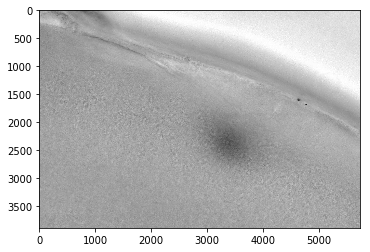

<IPython.core.display.Javascript object>

In [0]:
# Create Slideshow, decimated images already generated: Let's try it via Google's widgets
# https://colab.research.google.com/notebooks/widgets.ipynb#scrollTo=P6xc9QVFSlrw

# Still not good enough, very flashy, but at least text below image doesn't jump up and down like first attempt.
# I.e. the google.colab.widgets helped a bit.

from google.colab import widgets
from matplotlib import pylab

# One constant needs to be set:
images_directory = "/content/built/downsampled/651806289/"

from PIL import Image
from IPython.display import clear_output
import matplotlib.pyplot as plt
from numpy.random import randn
from time import sleep

# https://stackoverflow.com/a/3207973
only_files = [f for f in listdir(images_directory) if isfile(join(images_directory, f))]

only_files.sort()

# works:
#for a_file in only_files:   
#  clear_output()
#  print(a_file)
#  plt.imshow(Image.open(a_file), cmap = plt.cm.gray)
#  plt.show()
#  sleep(0.5)

  
grid = widgets.Grid(1, 1)
for a_file in only_files:   
  with grid.output_to(0,0):
    grid.clear_cell()
    print(a_file)
    #pylab.figure(figsize=(2, 2))
    #pylab.plot(np.random.random((10, 1)))
    plt.imshow(Image.open(a_file), cmap = plt.cm.gray)
    plt.show()
    sleep(0.5)
    

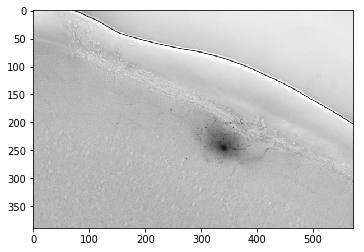

In [0]:
# display one
import matplotlib.pyplot as plt

# Assuming 0001.tif was downsampled as above:
output_file_name = "/content/brightfield_challenge_dataset/651806289/reconstruction_0_0539044762_644941196-0001.downsampled.tif"
downed_image = Image.open(output_file_name)
plt.imshow(downed_image, cmap = plt.cm.gray)

### Make animated GIF


In [0]:
# One constant needs to be set:
images_directory = "/content/built/downsampled/651806289/"


from PIL import Image
import matplotlib.pyplot as plt
from os.path import isfile, join

# https://stackoverflow.com/a/3207973
only_files = [f for f in listdir(images_directory) if isfile(join(images_directory, f))]

only_files.sort()

image_stack = []

for a_file in only_files:   
  image_stack.append(Image.open(join(images_directory, a_file)))  

animation_file_name = join(images_directory, "image_stack.gif")
# https://www.pythoninformer.com/python-libraries/pillow/creating-animated-gif/
image_stack[0].save(animation_file_name,
               format="GIF",
               save_all=True,
               append_images=image_stack[1:],
               duration=50,
               loop=0)

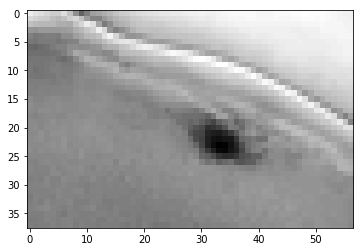

In [0]:
import matplotlib.pyplot as plt
from PIL import Image
file_name = "/content/built/downsampled/651806289/image_stack.gif"
ani_image = Image.open(file_name)
plt.imshow(ani_image, cmap = plt.cm.gray)

In [0]:
from google.colab import files
files.download("/content/built/downsampled/651806289/image_stack.gif") 

In [0]:
from IPython.display import HTML, display
import ipywidgets

animatedGif = "/content/built/downsampled/651806289/image_stack.gif"

file = open(animatedGif , "rb")
image = file.read()
#progress= ipywidgets.Image(
#    value=image,
#    format='gif',
#    width=100,
#    height=100)
display(progress)

Image(value=b'GIF89a9\x00&\x00\x86\x00\x00kkktttxxxyyy\x87\x87\x87\x89\x89\x89\x8d\x8d\x8d\x8e\x8e\x8e\x98\x98…

In [0]:
# Inspect animated gif
# https://pythontic.com/image-processing/pillow/extract%20frames%20from%20animated%20gif
from PIL import Image

animatedGif = "/content/built/downsampled/651806289/image_stack.gif"

imageObject = Image.open(animatedGif)

print(imageObject.is_animated)

print(imageObject.n_frames)

True
292


In [0]:
# TODO: add progress indicator
from IPython.display import HTML, display

def progress(value, max=100):
    return HTML("""
        <progress
            value='{value}'
            max='{max}',
            style='width: 100%'
        >
            {value}
        </progress>
    """.format(value=value, max=max))


# Set up a progress indicator for this slow task:
animatedGif = "/content/built/downsampled/651806289/image_stack.gif"

file = open(animatedGif , "rb")
image = file.read()
progressor= Image(
    value=image,
    format='gif',
    width=100,
    height=100)





progressIndicator = display(progress(0, 100), display_id=True)
progressIndicator_count = 0
progressIndicator_end = 105

for x in something:
  progressIndicator_count += 1
  progressIndicator.update(progress(progressIndicator_count, progressIndicator_end))


### TIFF to GIF then to animated GIF?


In [0]:
# 2 constants:
tifs_directory = "/content/built/downsampled/651806289/"
gifs_directory = "/content/built/downsampled/651806289/giffed/"

from PIL import Image
import matplotlib.pyplot as plt
from os.path import isfile, join
import os

if not os.path.exists(gifs_directory):
  os.makedirs(gifs_directory)

# https://stackoverflow.com/a/3207973
only_files = [f for f in listdir(tifs_directory) if isfile(join(tifs_directory, f))]

only_files.sort()

for a_file in only_files:
  in_file = join(tifs_directory, a_file)
  outname = os.path.basename(os.path.splitext(a_file)[0]) + ".gif"
  out_file = join(gifs_directory, outname)
  print(out_file)
  an_image = Image.open(in_file)  
  an_image.save(out_file, format="GIF")

/content/built/downsampled/651806289/giffed/image_stack.gif
/content/built/downsampled/651806289/giffed/reconstruction_0_0539044762_644941196-0001.downsampled.gif
/content/built/downsampled/651806289/giffed/reconstruction_0_0539044762_644941196-0001.gif
/content/built/downsampled/651806289/giffed/reconstruction_0_0539044762_644941196-0002.gif
/content/built/downsampled/651806289/giffed/reconstruction_0_0539044762_644941196-0003.gif
/content/built/downsampled/651806289/giffed/reconstruction_0_0539044762_644941196-0004.gif
/content/built/downsampled/651806289/giffed/reconstruction_0_0539044762_644941196-0005.gif
/content/built/downsampled/651806289/giffed/reconstruction_0_0539044762_644941196-0006.gif
/content/built/downsampled/651806289/giffed/reconstruction_0_0539044762_644941196-0007.gif
/content/built/downsampled/651806289/giffed/reconstruction_0_0539044762_644941196-0008.gif
/content/built/downsampled/651806289/giffed/reconstruction_0_0539044762_644941196-0009.gif
/content/built/dow

In [0]:
# This loads all files in a dir, that start with reconstruction_0_0539044762_644941196-
# Those 291 files are crammed into an animated GIF
#
# This was made while trying a multiple step process
# 1. decimate tif to tif
# 2. translarte tif to gif
# 3. animate gif
# But maybe that wasn't necessary. Maybe an odd sized file was causing trouble.


# One constant needs to be set:
images_directory = "/content/built/downsampled/651806289/giffed/"


from PIL import Image
import matplotlib.pyplot as plt
from os.path import isfile, join

# https://stackoverflow.com/a/3207973
only_files = [f for f in listdir(images_directory) if isfile(join(images_directory, f))]

only_files.sort()

image_stack = []

for a_file in only_files: 
  if a_file.startswith("reconstruction_0_0539044762_644941196-"):
    print(join(images_directory, a_file))
    image_stack.append(Image.open(join(images_directory, a_file)))  

animation_file_name = join(images_directory, "image_stack.gif")
# https://www.pythoninformer.com/python-libraries/pillow/creating-animated-gif/
image_stack[0].save(animation_file_name,
               format="GIF",
               save_all=True,
               append_images=image_stack[1:],
               duration=50,
               loop=0)

/content/built/downsampled/651806289/giffed/reconstruction_0_0539044762_644941196-0001.gif
/content/built/downsampled/651806289/giffed/reconstruction_0_0539044762_644941196-0002.gif
/content/built/downsampled/651806289/giffed/reconstruction_0_0539044762_644941196-0003.gif
/content/built/downsampled/651806289/giffed/reconstruction_0_0539044762_644941196-0004.gif
/content/built/downsampled/651806289/giffed/reconstruction_0_0539044762_644941196-0005.gif
/content/built/downsampled/651806289/giffed/reconstruction_0_0539044762_644941196-0006.gif
/content/built/downsampled/651806289/giffed/reconstruction_0_0539044762_644941196-0007.gif
/content/built/downsampled/651806289/giffed/reconstruction_0_0539044762_644941196-0008.gif
/content/built/downsampled/651806289/giffed/reconstruction_0_0539044762_644941196-0009.gif
/content/built/downsampled/651806289/giffed/reconstruction_0_0539044762_644941196-0010.gif
/content/built/downsampled/651806289/giffed/reconstruction_0_0539044762_644941196-0011.gif

In [0]:
!ls -lh /content/built/downsampled/651806289/giffed/im*

-rw-r--r-- 1 root root 67M Oct 16 03:16 /content/built/downsampled/651806289/giffed/image_stack.gif


In [0]:
from google.colab import files
files.download("/content/built/downsampled/651806289/giffed/image_stack.gif") 

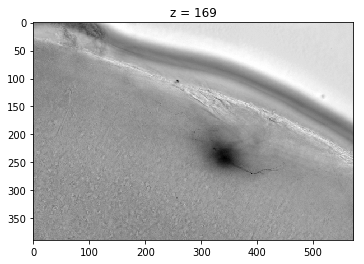

In [0]:
#@title Stack viewer { run: "auto" }

Z = 169 #@param {type:"slider", min:1, max:291, step:1}

import matplotlib.pyplot as plt
from PIL import Image

# Two constants needs to be set:
images_directory = "/content/built/downsampled/651806289/giffed/"
file_root = "reconstruction_0_0539044762_644941196-"

z_4_wide = '{:04}'.format(Z)
constructed_name = images_directory + file_root + z_4_wide + ".gif"
                      
downed_image = Image.open(constructed_name)
plt.title("z = " + str(Z))
plt.imshow(downed_image, cmap = plt.cm.gray)

### Make movie of Z-stack

[This worked but video was pretty useless. Never tried various parameters. Could probably be made much better. Compression, formats, blah blah.]

A movie can be played in a movie player, which has a time slider, which can be used as a Z-index control through the movie/imagestack.

In [0]:
# http://www.xavierdupre.fr/blog/2016-03-30_nojs.html

def make_video(images, outvid=None, fps=5, size=None,
  is_color=True, format="XVID"):
  """
  Create a video from a list of images.
 
  @param      outvid      output video
  @param      images      list of images to use in the video
  @param      fps         frame per second
  @param      size        size of each frame
  @param      is_color    color
  @param      format      see http://www.fourcc.org/codecs.php
  @return                 see http://opencv-python-tutroals.readthedocs.org/en/latest/py_tutorials/py_gui/py_video_display/py_video_display.html
 
  The function relies on http://opencv-python-tutroals.readthedocs.org/en/latest/.
  By default, the video will have the size of the first image.
  It will resize every image to this size before adding them to the video.
  """
  from cv2 import VideoWriter, VideoWriter_fourcc, imread, resize
  fourcc = VideoWriter_fourcc(*format)
  vid = None
  
  print("About to loop through %d files" % len(images))
  
  for image in images:
    if not os.path.exists(image):
      print("FNFE me")
      raise FileNotFoundError(image)
    img = imread(image)
    if vid is None:
      if size is None:
         size = img.shape[1], img.shape[0]
      vid = VideoWriter(outvid, fourcc, float(fps), size, is_color)
    if size[0] != img.shape[1] and size[1] != img.shape[0]:
      img = resize(img, size)
    vid.write(img)
  vid.release()
  return vid
 
# One constant needs to be set:
images_directory = "/content/built/downsampled/651806289/"

from PIL import Image
import matplotlib.pyplot as plt
from os.path import isfile, join

# https://stackoverflow.com/a/3207973
only_files = [f for f in listdir(images_directory) if isfile(join(images_directory, f))]

only_files.sort()

image_stack = []
for a_file in only_files: 
  if a_file.startswith("reconstruction_0_0539044762_644941196-"):
    #print(join(images_directory, a_file))
    image_stack.append(join(images_directory, a_file))  

    
movie_name = join(images_directory, "image_stack.mp4")
print("wha?")
make_video(image_stack, outvid=movie_name)  

wha?
About to loop through 292 files


<VideoWriter 0x7f93d30a3f30>

In [0]:
!ls -l /content/built/downsampled/651806289/im*

-rw-r--r-- 1 root root 69072388 Oct 16 02:21 /content/built/downsampled/651806289/image_stack.gif
-rw-r--r-- 1 root root    21364 Oct 16 03:56 /content/built/downsampled/651806289/image_stack.mp4


In [0]:
from google.colab import files
files.download("/content/built/downsampled/651806289/image_stack.mp4")